In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path

######## 설정 ##########
DATASET_DIR = Path("full_dataset")
WIN_SEC = 0.15  # RMS 계산할 때 사용할 윈도우 길이

def moving_rms(x, win):  
    win = max(1, int(win))
    kernel = np.ones(win) / win
    return np.sqrt(np.convolve(x**2, kernel, mode="same"))

# quiet_base를 이용한 초기 threshold 추출
print("--- 초기 노이즈 프로파일 추출 ---")
quiet_files = ["quiet_base_01.csv", "quiet_base_02.csv", "quiet_base_03.csv"] 
quiet_envs = []

for qf in quiet_files:
    path = DATASET_DIR / qf
    df = pd.read_csv(path)
    if len(df) > 1:
        v = df['voltage'].astype(float).to_numpy()
        t = df['t_wall'].astype(float).to_numpy()
            
        # 1초에 몇 프레임인지 계산
        dt = np.median(np.diff(t))
        if (np.isnan(dt) or dt <= 0): 
            continue
        fs = 1.0 / dt
            
        # 중앙값으로 영점 조절 후 RMS 봉투선 생성
        x_centered = v - np.median(v)
        win_samples = int(fs * WIN_SEC)
        env = moving_rms(x_centered, win_samples)
        quiet_envs.extend(env)

quiet_envs = np.array(quiet_envs)

# threshold 계산
GLOBAL_MED = np.median(quiet_envs) # 중앙값
GLOBAL_MAD = np.median(np.abs(quiet_envs - GLOBAL_MED)) # 변동폭 (중앙값과의 차)
if GLOBAL_MAD == 0: 
    GLOBAL_MAD = 1e-6

# 4. 초기 커트라인(Threshold) 설정
LOW_THRESHOLD = 3.0  # 노이즈 대비 3배 크기면 일단 피크 후보로 통과

print(f"현재 환경의 기본 백색소음(Median): {GLOBAL_MED:.8f}")
print(f"백색소음의 평균적인 변동폭(MAD): {GLOBAL_MAD:.8f}")
print(f"-> 설정된 초기 Z-score 커트라인: {LOW_THRESHOLD}")

--- 초기 노이즈 프로파일 추출 ---
현재 환경의 기본 백색소음(Median): 0.00004947
백색소음의 평균적인 변동폭(MAD): 0.00000767
-> 설정된 초기 Z-score 커트라인: 3.0


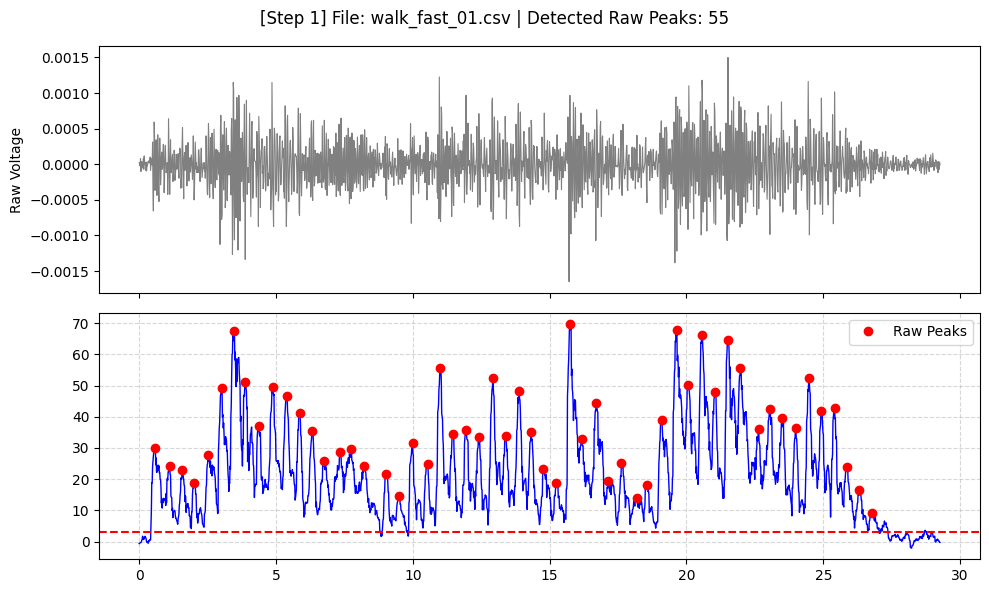

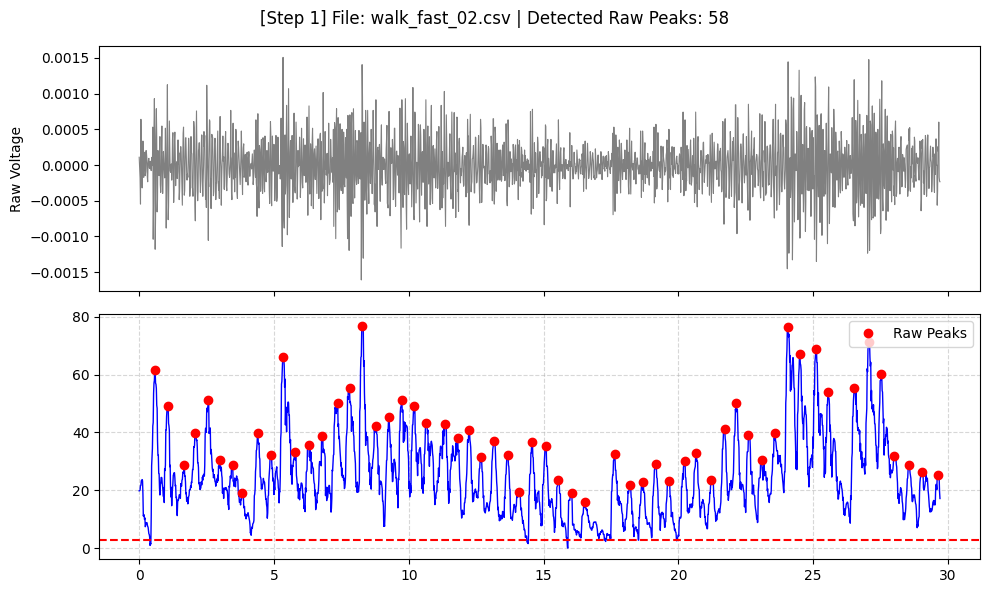

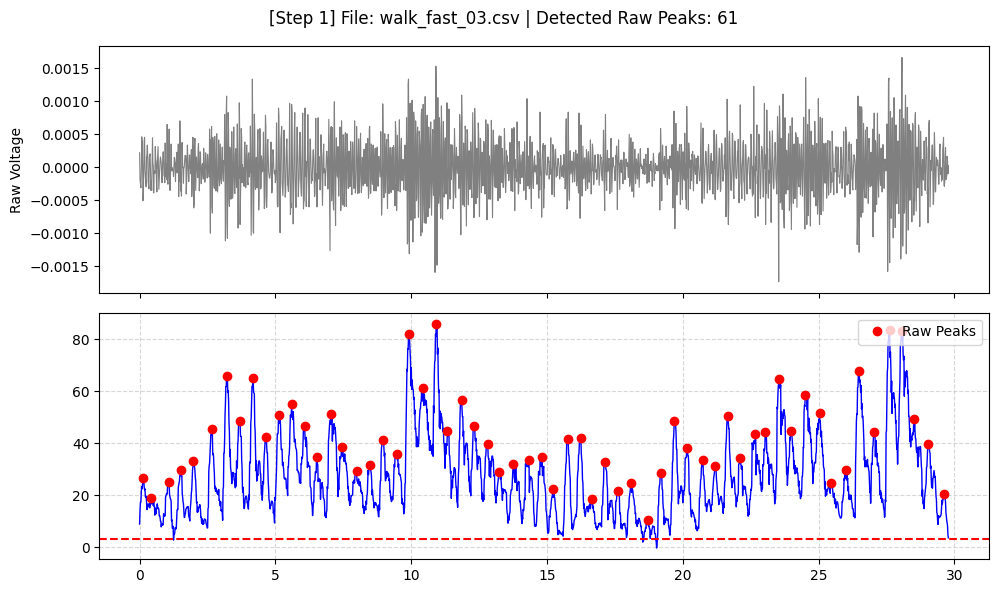

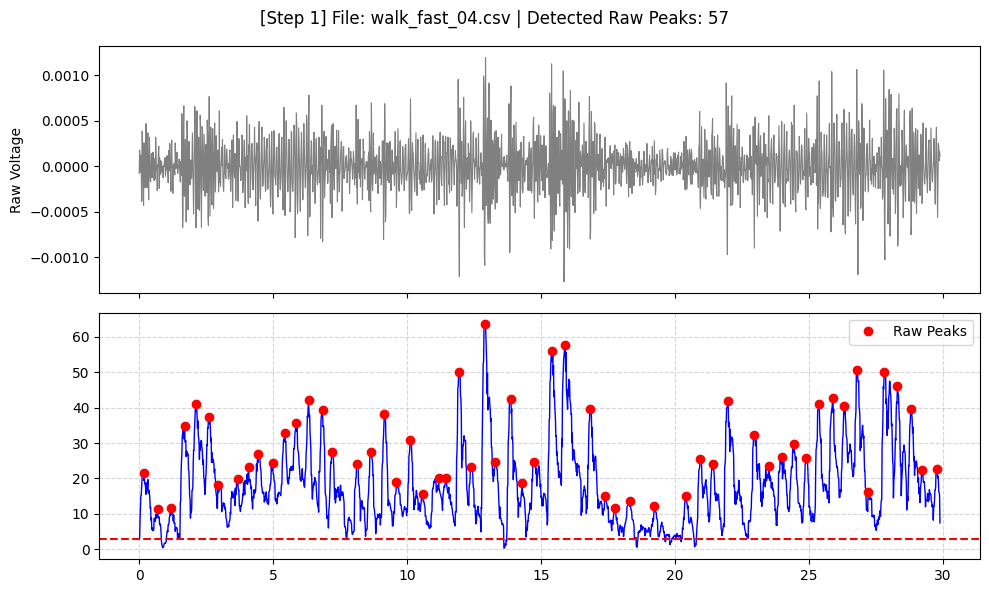

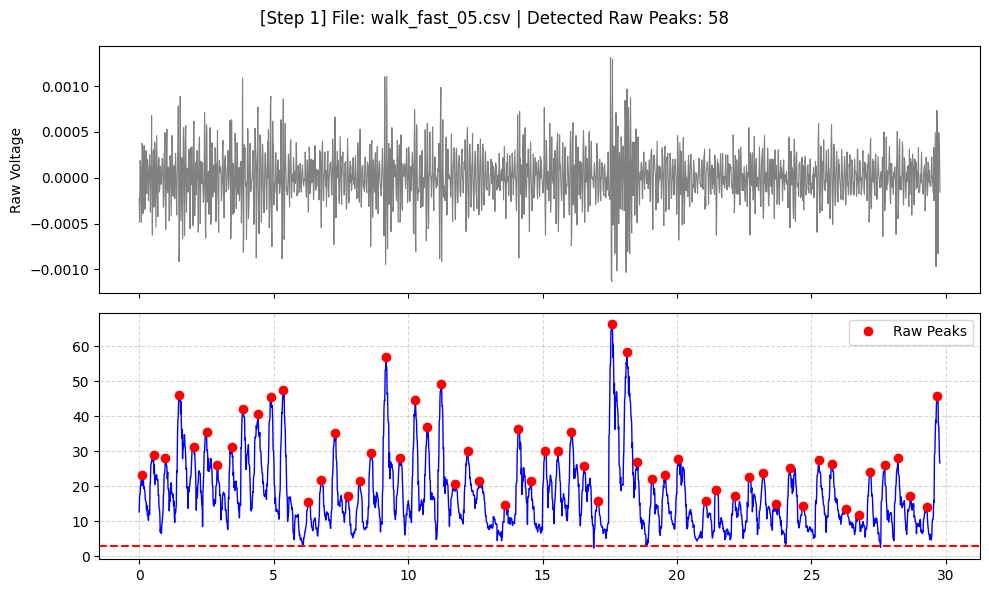

...

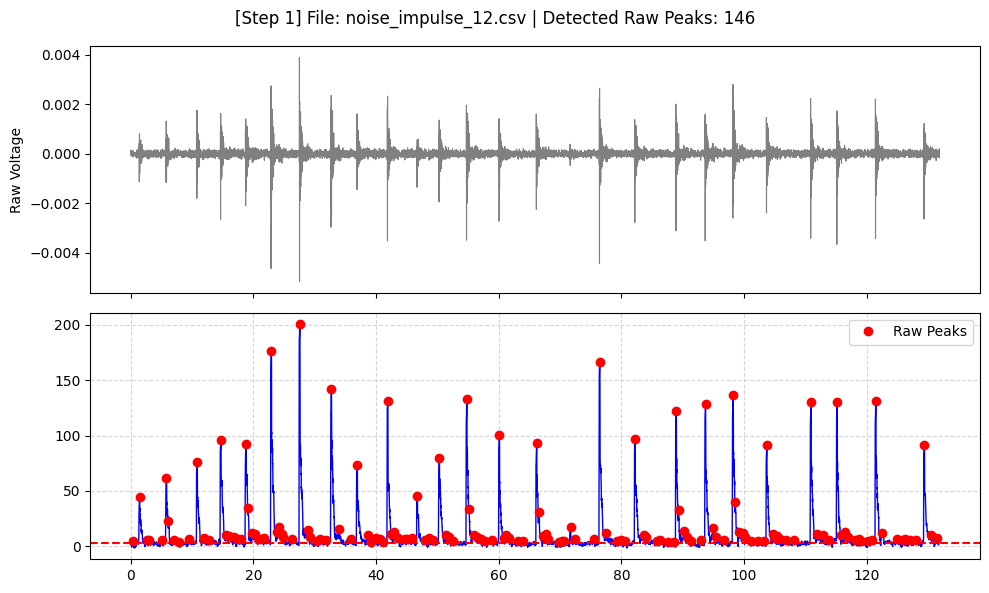

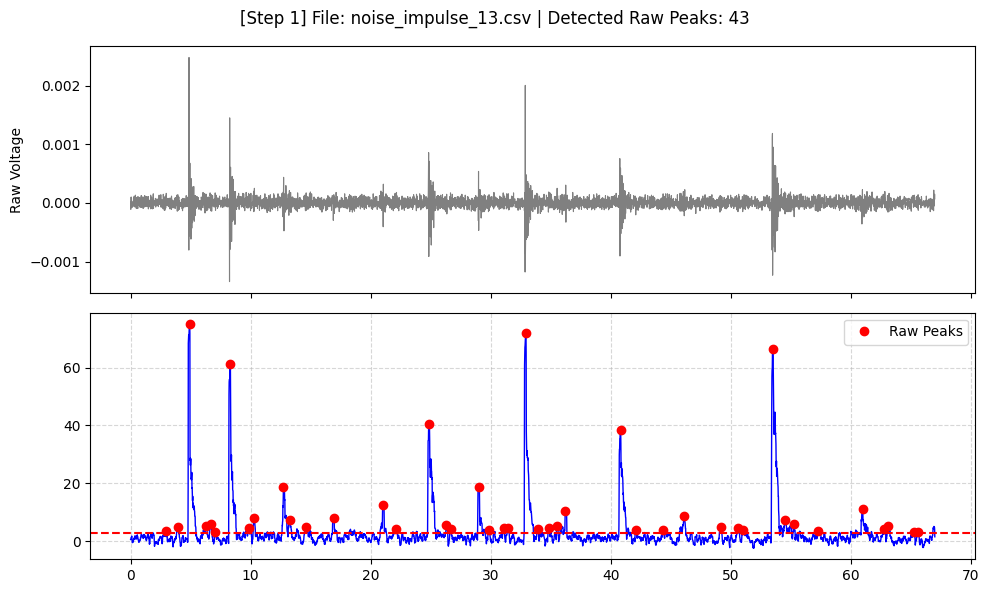

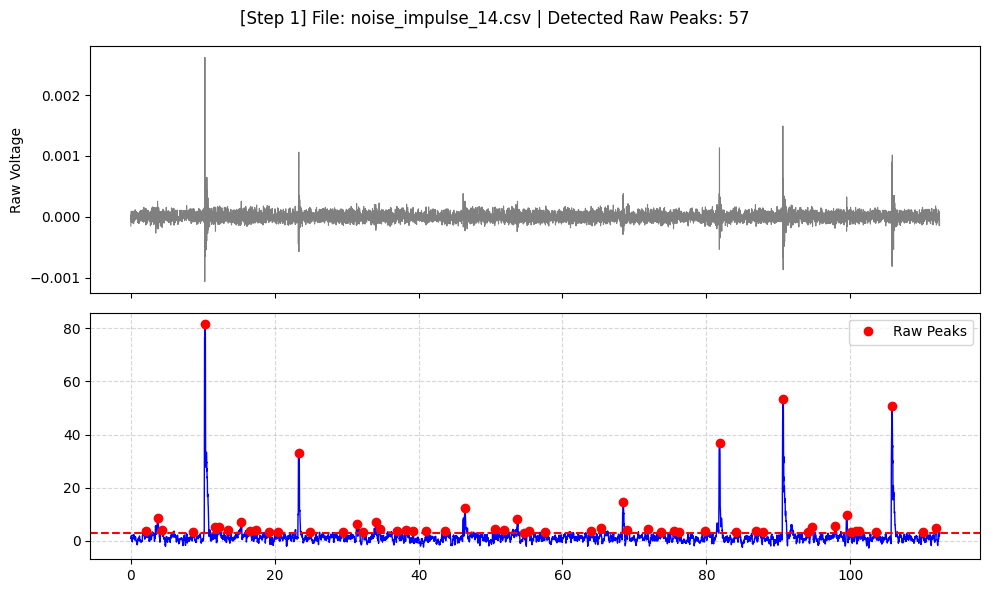

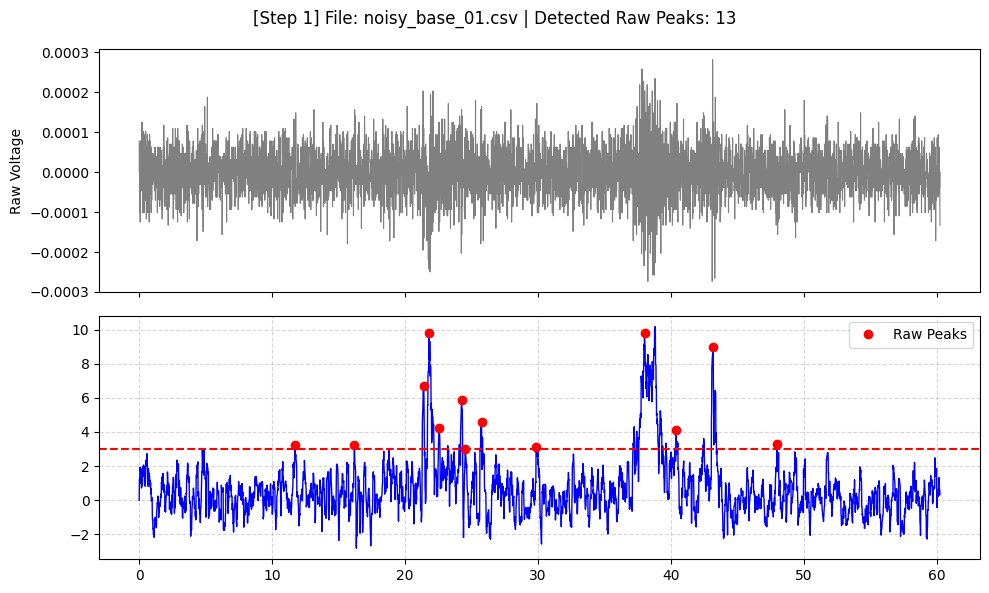

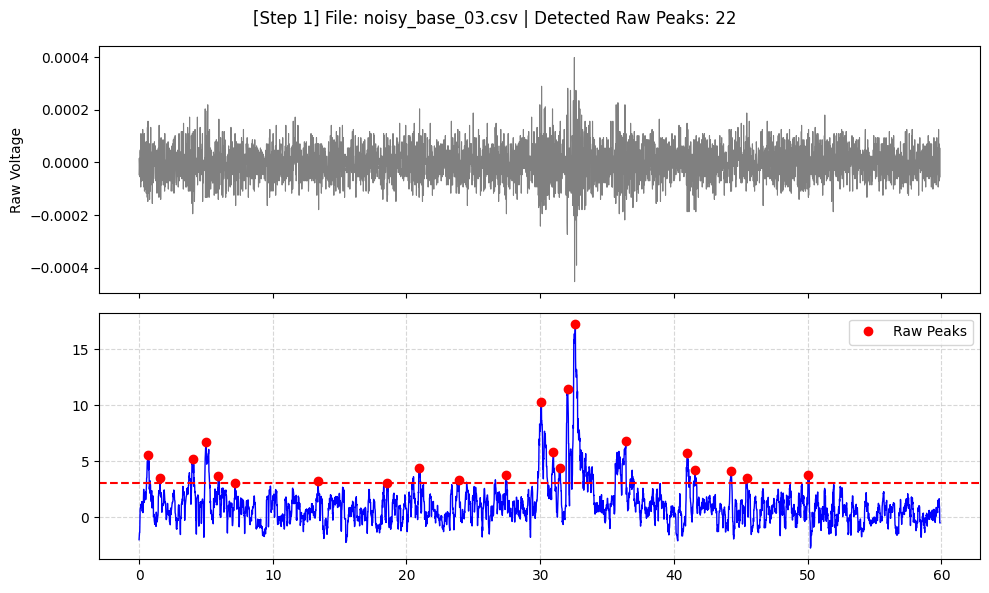

In [17]:
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
# 시각화할 파일 목록
visualization_files = {
    "walk": [
        "walk_fast_01.csv", "walk_fast_02.csv", "walk_fast_03.csv", "walk_fast_04.csv", "walk_fast_05.csv", "walk_fast_06.csv",
        "walk_normal_01.csv", "walk_normal_02.csv", "walk_normal_03.csv", "walk_normal_04.csv", "walk_normal_05.csv", "walk_normal_06.csv",
        "walk_slow_01.csv", "walk_slow_02.csv", "walk_slow_03.csv", "walk_slow_04.csv", "walk_slow_05.csv"
    ],
    "noise": [
        "noise_impulse_01.csv", "noise_impulse_02.csv", "noise_impulse_03.csv", "noise_impulse_04.csv", "noise_impulse_05.csv", "noise_impulse_06.csv",
         "noise_impulse_07.csv", "noise_impulse_08.csv", "noise_impulse_09.csv", "noise_impulse_10.csv", "noise_impulse_11.csv", "noise_impulse_12.csv", "noise_impulse_13.csv", "noise_impulse_14.csv", 
        "noisy_base_01.csv", "noisy_base_02.csv", "noisy_base_03.csv"
    ]
}

# 2단계를 위해 데이터를 넘겨줄 임시 저장소
step1_results = []

for label, filenames in visualization_files.items():
    for fname in filenames:
        path = DATASET_DIR / fname
        if not path.exists():
            continue
            
        df = pd.read_csv(path)
        if len(df) < 2: continue
        t = df['t_wall'].astype(float).to_numpy()
        v = df['voltage'].astype(float).to_numpy()
        t_rel = t - t[0]
        dt = np.median(np.diff(t))
        if np.isnan(dt) or dt <= 0: continue
        fs = 1.0 / dt
        
        # Z-score 변환
        x_centered = v - np.median(v)
        win_samples = int(fs * WIN_SEC)
        env = moving_rms(x_centered, win_samples)
        z_env = (env - GLOBAL_MED) / (1.4826 * GLOBAL_MAD)
        
        # 1단계: 모양 기반 탐지
        min_distance_samples = int(fs * 0.3)
        min_prominence = 4.0
        min_width_samples = int(fs * 0.05)
        max_width_samples = int(fs * 0.50)
        
        raw_peaks, _ = find_peaks(
            z_env, height=LOW_THRESHOLD, distance=min_distance_samples,
            prominence=min_prominence, width=[min_width_samples, max_width_samples]
        )
        
        # 데이터 저장
        step1_results.append({
            'fname': fname, 'label': label, 't_rel': t_rel, 'v': v,
            'z_env': z_env, 'raw_peaks': raw_peaks
        })
        
        # 1단계 시각화
        fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
        fig.suptitle(f"[Step 1] File: {fname} | Detected Raw Peaks: {len(raw_peaks)}")
        
        axes[0].plot(t_rel, v, color='gray', linewidth=0.8)
        axes[0].set_ylabel("Raw Voltage")
        
        axes[1].plot(t_rel, z_env, color='blue', linewidth=1.0)
        axes[1].axhline(LOW_THRESHOLD, color='red', linestyle='--')
        axes[1].plot(t_rel[raw_peaks], z_env[raw_peaks], "ro", markersize=6, label='Raw Peaks')
        
        axes[1].legend(loc='upper right')
        axes[1].grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

--- 잔진동 peak 결과 시각화 시작 ---


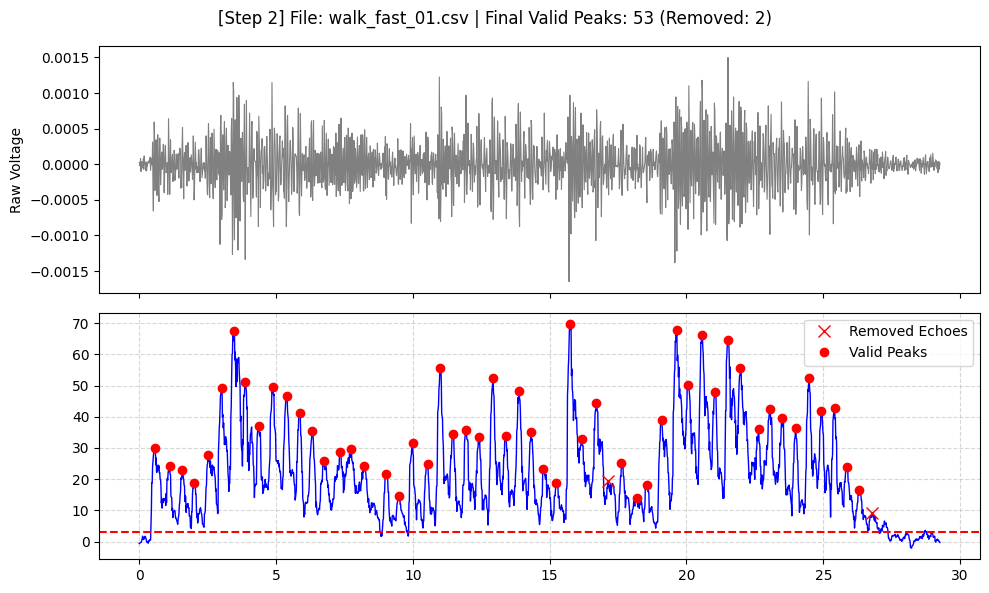

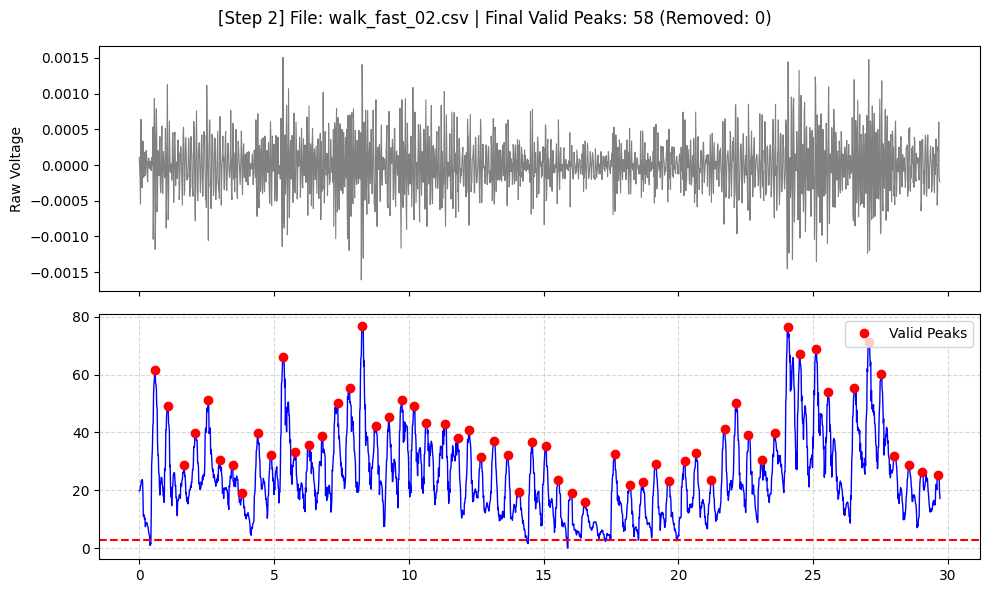

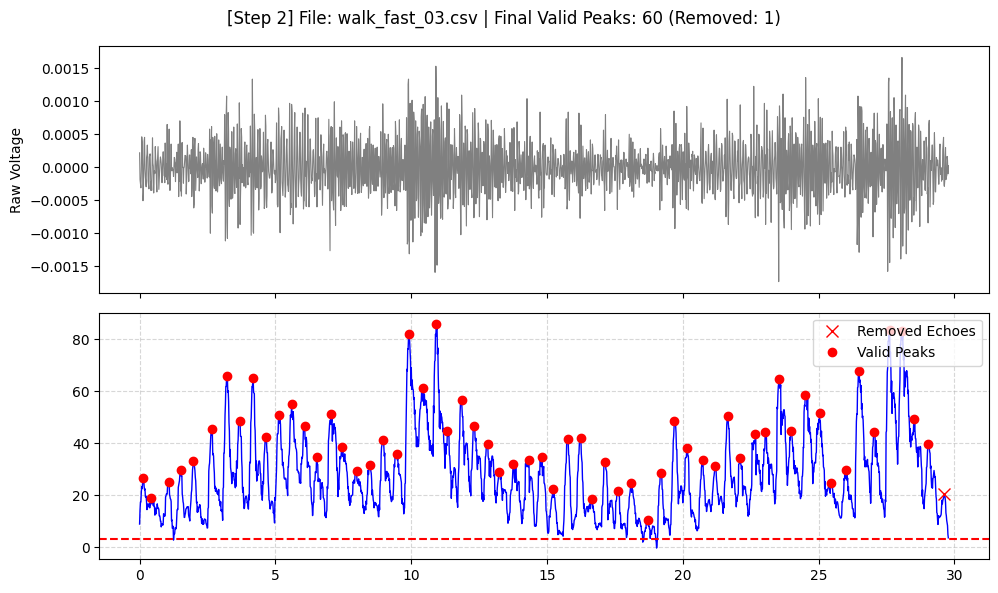

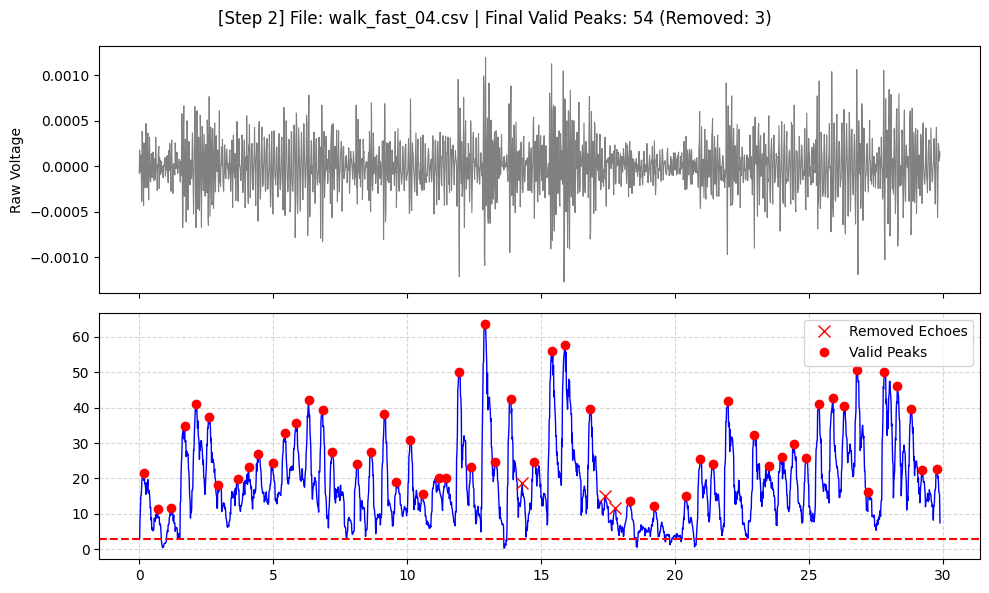

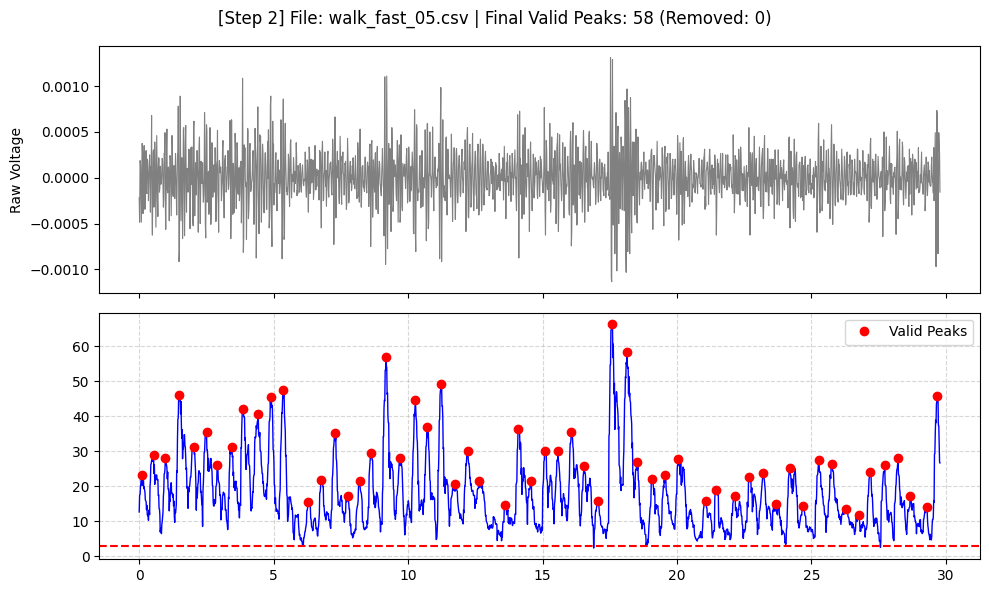

...

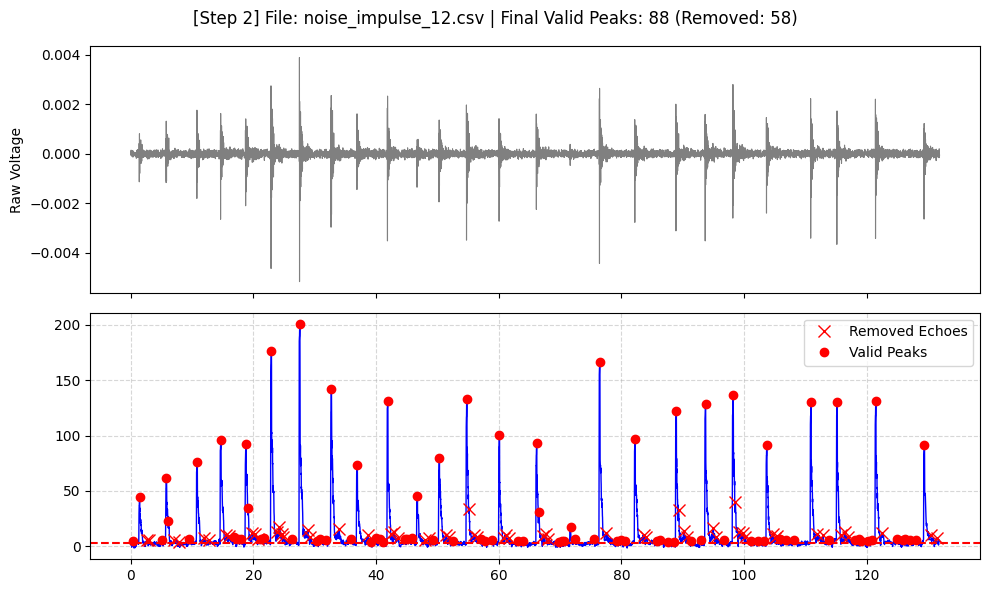

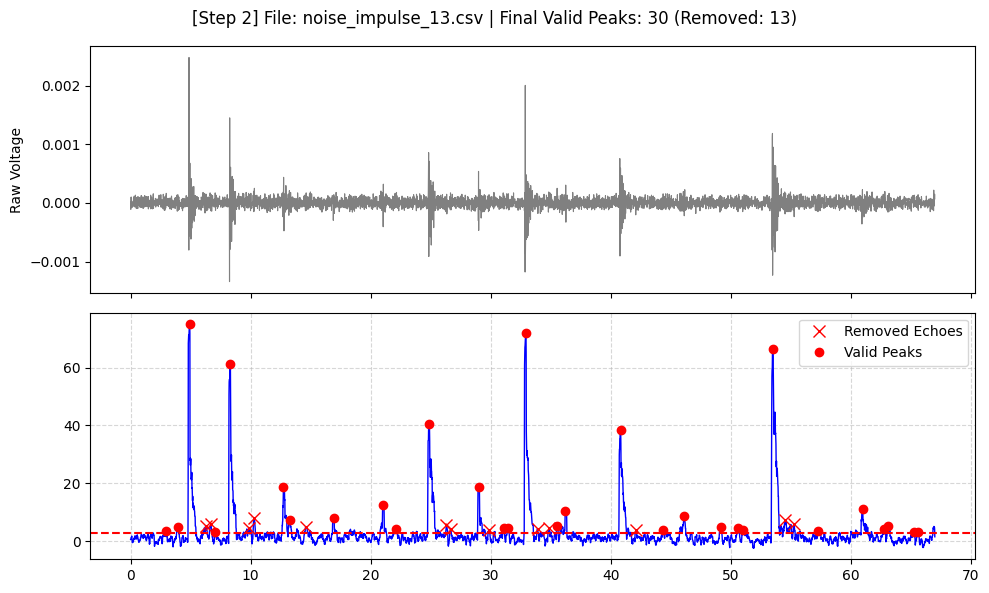

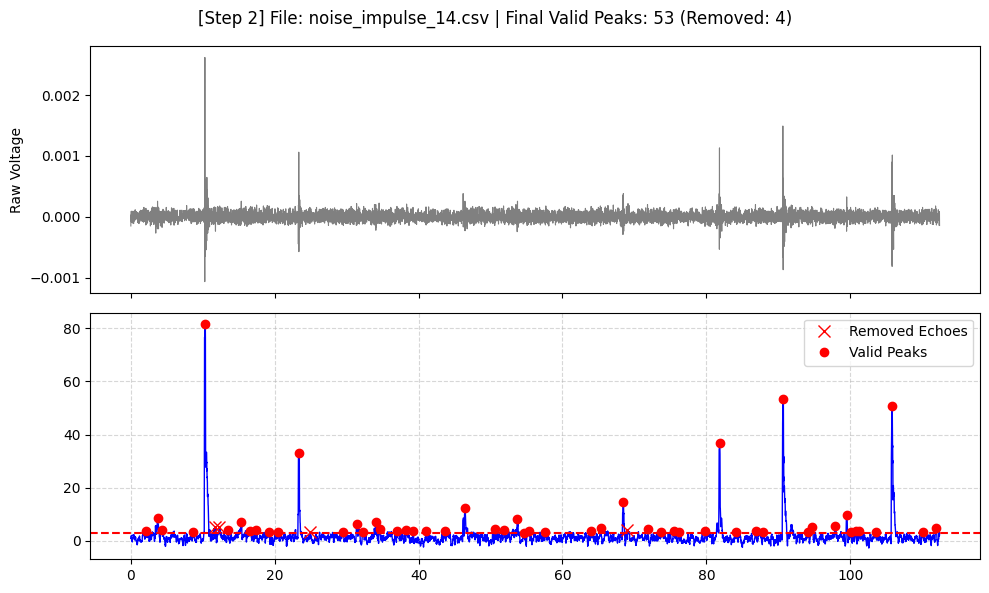

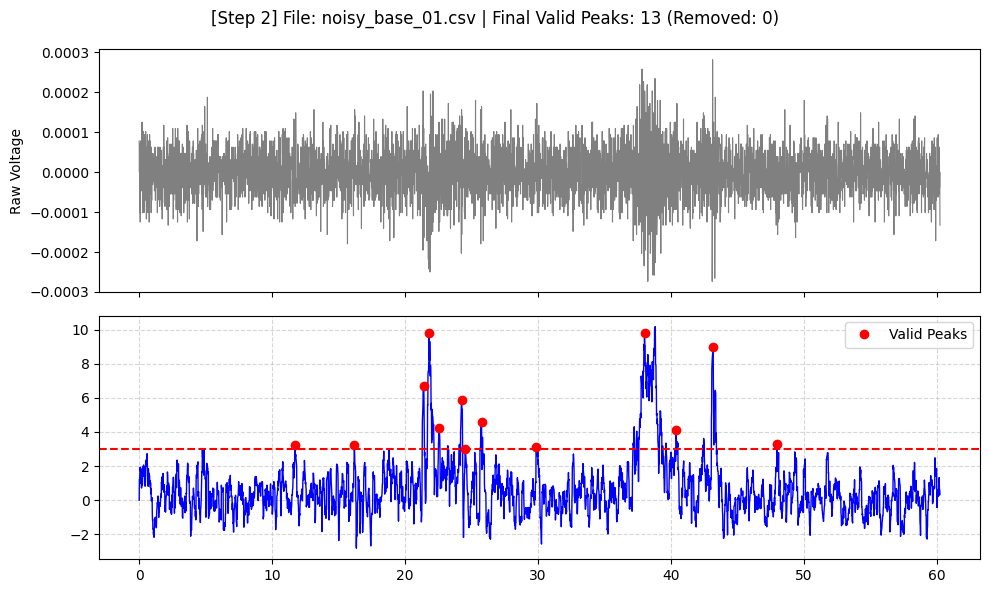

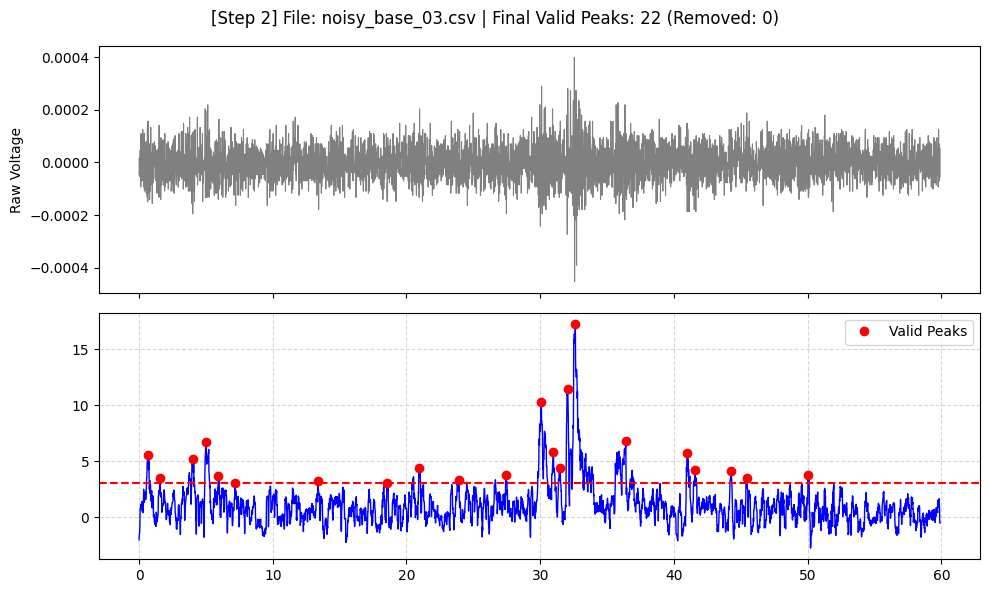

walk_fast_01.csv: 55 -> 53
walk_fast_02.csv: 58 -> 58
walk_fast_03.csv: 61 -> 60
walk_fast_04.csv: 57 -> 54
walk_fast_05.csv: 58 -> 58
walk_fast_06.csv: 61 -> 60
walk_normal_01.csv: 47 -> 47
walk_normal_02.csv: 48 -> 47
walk_normal_03.csv: 47 -> 45
walk_normal_04.csv: 50 -> 49
walk_normal_05.csv: 42 -> 42
walk_normal_06.csv: 45 -> 45
walk_slow_01.csv: 35 -> 31
walk_slow_02.csv: 39 -> 37
walk_slow_03.csv: 35 -> 35
walk_slow_04.csv: 43 -> 43
walk_slow_05.csv: 36 -> 35
noise_impulse_01.csv: 27 -> 18
noise_impulse_02.csv: 17 -> 9
noise_impulse_03.csv: 18 -> 12
noise_impulse_04.csv: 18 -> 11
noise_impulse_05.csv: 20 -> 13
noise_impulse_06.csv: 17 -> 13
noise_impulse_07.csv: 17 -> 12
noise_impulse_08.csv: 18 -> 13
noise_impulse_09.csv: 25 -> 16
noise_impulse_10.csv: 12 -> 8
noise_impulse_11.csv: 21 -> 16
noise_impulse_12.csv: 146 -> 88
noise_impulse_13.csv: 43 -> 30
noise_impulse_14.csv: 57 -> 53
noisy_base_01.csv: 13 -> 13
noisy_base_03.csv: 22 -> 22


In [18]:
print("--- 잔진동 peak 결과 시각화 시작 ---")

numList = []
for data in step1_results:
    fname = data['fname']
    t_rel = data['t_rel']
    v = data['v']
    z_env = data['z_env']
    raw_peaks = data['raw_peaks']
    
    # 2단계: 여진 제거 로직 적용
    valid_peaks = []
    for p in raw_peaks:
        is_echo = False
        for vp in reversed(valid_peaks):
            if (t_rel[p] - t_rel[vp]) > 2.0: 
                break 
            if z_env[p] < z_env[vp] * 0.3: 
                is_echo = True
                break
        if not is_echo:
            valid_peaks.append(p)
            
    valid_peaks = np.array(valid_peaks)
    echo_peaks = [p for p in raw_peaks if p not in valid_peaks]
    
    # 2단계 시각화
    fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)
    fig.suptitle(f"[Step 2] File: {fname} | Final Valid Peaks: {len(valid_peaks)} (Removed: {len(echo_peaks)})")
    
    axes[0].plot(t_rel, v, color='gray', linewidth=0.8)
    axes[0].set_ylabel("Raw Voltage")
    
    axes[1].plot(t_rel, z_env, color='blue', linewidth=1.0)
    axes[1].axhline(LOW_THRESHOLD, color='red', linestyle='--')
    
    # 걸러진 여진은 빨간 X로 표시
    if len(echo_peaks) > 0:
        axes[1].plot(t_rel[echo_peaks], z_env[echo_peaks], "x", color='red', markersize=8, label='Removed Echoes')
        
    # 최종 생존 피크는 빨간 점으로 표시
    if len(valid_peaks) > 0:
        axes[1].plot(t_rel[valid_peaks], z_env[valid_peaks], "ro", markersize=6, label='Valid Peaks')
        
    axes[1].legend(loc='upper right')
    axes[1].grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
    numList.append(f"{fname}: {len(valid_peaks) + len(echo_peaks)} -> {len(valid_peaks)}")

for i in range(len(step1_results)):
    print(numList[i])

    

In [19]:
import numpy as np
import pandas as pd
from scipy.signal import find_peaks, peak_prominences, peak_widths

print("--- 최종 특성(Feature) 추출 및 데이터프레임(df_train) 생성 ---")

# 업데이트된 전체 파일 목록 (쉼표 오류 수정됨)
train_files = {
    "walk": [
        "walk_fast_01.csv", "walk_fast_02.csv", "walk_fast_03.csv", "walk_fast_04.csv", "walk_fast_05.csv", "walk_fast_06.csv",
        "walk_normal_01.csv", "walk_normal_02.csv", "walk_normal_03.csv", "walk_normal_04.csv", "walk_normal_05.csv", "walk_normal_06.csv",
        "walk_slow_01.csv", "walk_slow_02.csv", "walk_slow_03.csv", "walk_slow_04.csv", "walk_slow_05.csv"
    ],
    "noise": [
        "noise_impulse_01.csv", "noise_impulse_02.csv", "noise_impulse_03.csv", "noise_impulse_04.csv", "noise_impulse_05.csv", "noise_impulse_06.csv",
        "noise_impulse_07.csv", "noise_impulse_08.csv", "noise_impulse_09.csv", "noise_impulse_10.csv", "noise_impulse_11.csv", "noise_impulse_12.csv", "noise_impulse_13.csv", "noise_impulse_14.csv", 
        "noisy_base_01.csv", "noisy_base_02.csv", "noisy_base_03.csv"
    ]
}

features_list = []

for label, filenames in train_files.items():
    for fname in filenames:
        path = DATASET_DIR / fname
        if not path.exists():
            print(f"경고: [{fname}] 파일을 찾을 수 없어 건너뜁니다.")
            continue
            
        df = pd.read_csv(path)
        if len(df) < 2: 
            print(f"경고: [{fname}] 데이터 길이가 너무 짧아 건너뜁니다.")
            continue
            
        t = df['t_wall'].astype(float).to_numpy()
        v = df['voltage'].astype(float).to_numpy()
        t_rel = t - t[0]
        
        dt = np.median(np.diff(t))
        if np.isnan(dt) or dt <= 0: 
            print(f"경고: [{fname}] 시간 간격(dt) 오류로 건너뜁니다.")
            continue
        fs = 1.0 / dt
        
        # Z-score 변환
        x_centered = v - np.median(v)
        win_samples = int(fs * WIN_SEC)
        env = moving_rms(x_centered, win_samples)
        z_env = (env - GLOBAL_MED) / (1.4826 * GLOBAL_MAD)
        
        # 1단계: 모양 기반 탐지
        min_distance_samples = int(fs * 0.3)
        min_prominence = 4.0
        min_width_samples = int(fs * 0.05)
        max_width_samples = int(fs * 0.50)
        
        raw_peaks, _ = find_peaks(
            z_env, height=LOW_THRESHOLD, distance=min_distance_samples,
            prominence=min_prominence, width=[min_width_samples, max_width_samples]
        )
        
        # 2단계: 여진 제거
        valid_peaks = []
        for p in raw_peaks:
            is_echo = False
            for vp in reversed(valid_peaks):
                if (t_rel[p] - t_rel[vp]) > 2.0: break
                if z_env[p] < z_env[vp] * 0.3:
                    is_echo = True
                    break
            if not is_echo:
                valid_peaks.append(p)
                
        if len(valid_peaks) == 0: 
            # 피크가 하나도 없으면 특성 추출 불가능하므로 패스 (noisy_base의 조용한 구간 등)
            continue
            
        # 3단계: 11개 특성 추출
        prominences = peak_prominences(z_env, valid_peaks)[0]
        widths_sec = peak_widths(z_env, valid_peaks, rel_height=0.5)[0] / fs
        
        for i, p_idx in enumerate(valid_peaks):
            p_time = t_rel[p_idx]
            
            # 피크 중심 ±0.25초 구간 확보
            half_win = int(fs * 0.25)
            start_idx = max(0, p_idx - half_win)
            end_idx = min(len(z_env), p_idx + half_win + 1)
            local_z = z_env[start_idx:end_idx]
            
            peak_height = z_env[p_idx]
            peak_prominence = prominences[i]
            peak_width_sec = widths_sec[i]
            
            local_rms = np.sqrt(np.mean(local_z**2))
            local_energy = np.sum(local_z**2)
            area_above_thresh = np.sum(np.maximum(local_z - LOW_THRESHOLD, 0)) / fs
            
            # 시계열 맥락 특성 계산
            if i == 0:
                is_first_peak = 1
                interval_prev = 0.5386 
                recent_peak_count_2s = 0
                height_ratio_prev = 1.0
                prominence_ratio_prev = 1.0
            else:
                prev_idx = valid_peaks[i-1]
                interval_prev = p_time - t_rel[prev_idx]
                
                recent_times = t_rel[valid_peaks[:i]]
                time_diffs = p_time - recent_times
                recent_peak_count_2s = int(np.sum((time_diffs > 0) & (time_diffs <= 2.0)))
                
                if interval_prev > 3.0:
                    is_first_peak = 1
                    interval_prev = 0.5386
                    height_ratio_prev = 1.0
                    prominence_ratio_prev = 1.0
                else:
                    is_first_peak = 0
                    prev_height = z_env[prev_idx]
                    prev_prom = prominences[i-1]
                    height_ratio_prev = peak_height / prev_height if prev_height > 0 else 1.0
                    prominence_ratio_prev = peak_prominence / prev_prom if prev_prom > 0 else 1.0
                    
            features_list.append({
                'filename': fname,
                'label': label,
                'peak_time_sec': p_time,
                'peak_height': peak_height,
                'peak_prominence': peak_prominence,
                'peak_width_sec': peak_width_sec,
                'local_rms': local_rms,
                'local_energy': local_energy,
                'area_above_threshold': area_above_thresh,
                'interval_prev': interval_prev,
                'recent_peak_count_2s': recent_peak_count_2s,
                'height_ratio_prev': height_ratio_prev,
                'prominence_ratio_prev': prominence_ratio_prev,
                'is_first_peak': is_first_peak
            })

df_train = pd.DataFrame(features_list)
print(f"\n-> 특성 추출 완료! 전체 데이터(피크) 개수: {len(df_train)}개")
print("\n[라벨별 추출된 피크 수]")
print(df_train['label'].value_counts())
display(df_train.head())

--- 최종 특성(Feature) 추출 및 데이터프레임(df_train) 생성 ---
경고: [noisy_base_02.csv] 시간 간격(dt) 오류로 건너뜁니다.

-> 특성 추출 완료! 전체 데이터(피크) 개수: 1146개

[라벨별 추출된 피크 수]
label
walk     799
noise    347
Name: count, dtype: int64


,filename,label,peak_time_sec,peak_height,peak_prominence,peak_width_sec,local_rms,local_energy,area_above_threshold,interval_prev,recent_peak_count_2s,height_ratio_prev,prominence_ratio_prev,is_first_peak
0,walk_fast_01.csv,walk,0.561972,30.076938,25.935784,0.340110,20.362309,14511.827285,7.661166,0.538600,0,1.000000,1.000000,1
1,walk_fast_01.csv,walk,1.115736,24.061699,13.329356,0.144373,15.263488,8154.092397,5.777406,0.553764,1,0.800005,0.513937,0
2,walk_fast_01.csv,walk,1.568375,22.831035,17.267047,0.175419,14.235509,7092.740403,5.229419,0.452639,2,0.948854,1.295415,0
3,walk_fast_01.csv,walk,2.020939,18.651678,14.024316,0.150173,11.962369,5008.439665,4.191163,0.452564,3,0.816944,0.812201,0
4,walk_fast_01.csv,walk,2.517129,27.796906,18.816553,0.326655,19.824192,13754.951123,7.745058,0.496190,4,1.490317,1.341709,0


In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import joblib

print("--- [머신러닝 학습 단계] 기계가 스스로 최적의 파라미터 탐색 및 저장 ---")

# 1. 학습에 사용할 11개 특성(Feature) 리스트
feature_cols = [
    'peak_height', 'peak_prominence', 'peak_width_sec', 
    'local_rms', 'local_energy', 'area_above_threshold', 
    'interval_prev', 'recent_peak_count_2s', 
    'height_ratio_prev', 'prominence_ratio_prev', 'is_first_peak'
]

X_train = df_train[feature_cols]
y_train = df_train['label'].apply(lambda x: 1 if x == 'walk' else 0)

# 2. 기계가 탐색할 파라미터의 범위 설정 (Grid)
param_grid = {
    'n_estimators': [50, 100, 200],         # 나무의 개수
    'max_depth': [5, 7, 10, None],          # 최대 깊이
    'min_samples_split': [2, 5, 10],        # 분할 최소 샘플 수
    'min_samples_leaf': [1, 2, 4]           # 잎 노드 최소 샘플 수
}

# 3. 기본 모델 및 교차 검증 설정
rf_base = RandomForestClassifier(class_weight='balanced', random_state=42)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 4. GridSearchCV를 통한 자동 최적화 진행
# n_jobs=-1로 설정하여 컴퓨터의 모든 CPU 코어를 사용해 속도 극대화
grid_search = GridSearchCV(
    estimator=rf_base,
    param_grid=param_grid,
    cv=skf,
    scoring='roc_auc',
    n_jobs=-1, 
    verbose=1
)

print("기계가 수백 가지 조합을 테스트하며 최적의 파라미터를 스스로 찾는 중입니다...")
grid_search.fit(X_train, y_train)

# 5. 기계가 찾은 결과 출력
print("\n================ [탐색 완료] ================")
print(f"최고의 교차 검증 ROC-AUC 점수: {grid_search.best_score_:.4f}")
print("기계가 스스로 찾은 최적의 파라미터:")
for key, value in grid_search.best_params_.items():
    print(f" - {key}: {value}")

# 6. 1등을 차지한 최적의 모델을 변수에 담고 파일로 저장
best_rf_model = grid_search.best_estimator_
model_filename = 'har_geophone_rf_model_final.pkl'
joblib.dump(best_rf_model, model_filename)

print(f"\n-> 스스로 최적화된 최종 모델이 '{model_filename}' 이름으로 저장되었습니다.")

--- [머신러닝 학습 단계] 기계가 스스로 최적의 파라미터 탐색 및 저장 ---
기계가 수백 가지 조합을 테스트하며 최적의 파라미터를 스스로 찾는 중입니다...
Fitting 5 folds for each of 108 candidates, totalling 540 fits

================ [탐색 완료] ================
최고의 교차 검증 ROC-AUC 점수: 0.9789
기계가 스스로 찾은 최적의 파라미터:
 - max_depth: 7
 - min_samples_leaf: 1
 - min_samples_split: 5
 - n_estimators: 50

-> 스스로 최적화된 최종 모델이 'har_geophone_rf_model_final.pkl' 이름으로 저장되었습니다.


--- [최종 검증] 연속 데이터 실전 테스트 및 다수결 필터 적용 ---


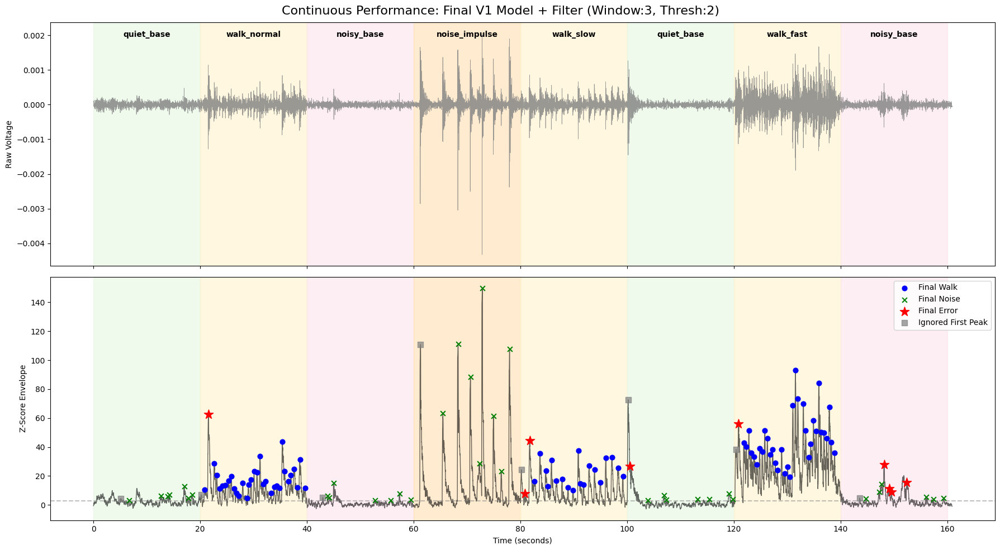


[다수결 필터 적용 후 최종 Classification Report (각 구간 첫 피크 제외)]


,precision,recall,f1-score,support
Noise (0),0.8974,0.8750,0.8861,40.0000
Walk (1),0.9444,0.9551,0.9497,89.0000
accuracy,0.9302,0.9302,0.9302,0.9302
macro avg,0.9209,0.9150,0.9179,129.0000
weighted avg,0.9299,0.9302,0.9300,129.0000


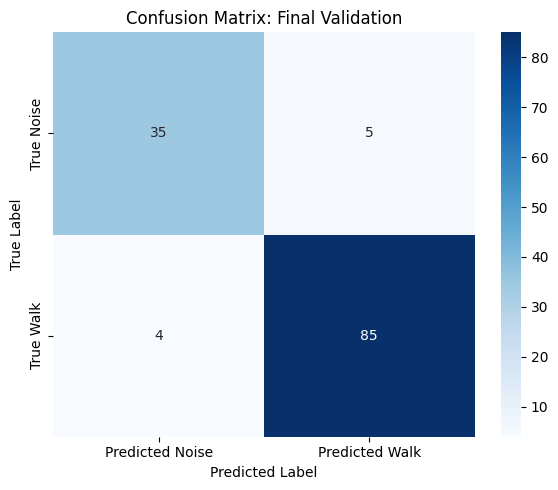


최종적으로 남은 오탐(Error) 수: 9개


,peak_time_sec,true_label_str,pred_binary,final_state
10,21.555078,walk_normal,0,0
60,80.814104,walk_slow,1,0
61,81.747967,walk_slow,0,0
82,100.532893,quiet_base,0,1
91,120.864135,walk_fast,1,0
130,148.144077,noisy_base,1,1
131,149.106702,noisy_base,1,1
132,149.501045,noisy_base,1,1
133,152.405476,noisy_base,0,1


In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, peak_prominences, peak_widths
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from collections import deque
import joblib

print("--- [최종 검증] 연속 데이터 실전 테스트 및 다수결 필터 적용 ---")

# 1. 라벨 데이터 및 연속 데이터 불러오기
label_path = DATASET_DIR / 'mixed_continuous_label.csv'
data_path = DATASET_DIR / 'mixed_continuous.csv'

df_label = pd.read_csv(label_path)
df_cont = pd.read_csv(data_path)

t = df_cont['t_wall'].astype(float).to_numpy()
v = df_cont['voltage'].astype(float).to_numpy()
t_rel = t - t[0]

dt = np.median(np.diff(t))
fs = 1.0 / dt

# 2. 신호 전처리 (Z-score Envelope)
x_centered = v - np.median(v)
win_samples = int(fs * WIN_SEC)
env = moving_rms(x_centered, win_samples)
z_env = (env - GLOBAL_MED) / (1.4826 * GLOBAL_MAD)

# 3. 1단계: 모양 기반 탐지
min_distance_samples = int(fs * 0.3)
min_prominence = 4.0
min_width_samples = int(fs * 0.05)
max_width_samples = int(fs * 0.50)

raw_peaks, _ = find_peaks(
    z_env, height=LOW_THRESHOLD, distance=min_distance_samples,
    prominence=min_prominence, width=[min_width_samples, max_width_samples]
)

# 4. 2단계: 여진 제거
valid_peaks = []
for p in raw_peaks:
    is_echo = False
    for vp in reversed(valid_peaks):
        if (t_rel[p] - t_rel[vp]) > 2.0: break
        if z_env[p] < z_env[vp] * 0.3:
            is_echo = True
            break
    if not is_echo:
        valid_peaks.append(p)

valid_peaks = np.array(valid_peaks)

# 5. 3단계: 11개 특성 추출 및 정답 라벨 매핑
features_list = []
if len(valid_peaks) > 0:
    prominences = peak_prominences(z_env, valid_peaks)[0]
    widths_sec = peak_widths(z_env, valid_peaks, rel_height=0.5)[0] / fs
    
    for i, p_idx in enumerate(valid_peaks):
        p_time = t_rel[p_idx]
        
        true_label_row = df_label[(df_label['start_sec'] <= p_time) & (df_label['end_sec'] > p_time)]
        if not true_label_row.empty:
            true_label_str = true_label_row['label'].values[0]
        else:
            true_label_str = 'quiet_base'
            
        true_binary = 1 if 'walk' in true_label_str else 0
        
        half_win = int(fs * 0.25)
        start_idx = max(0, p_idx - half_win)
        end_idx = min(len(z_env), p_idx + half_win + 1)
        local_z = z_env[start_idx:end_idx]
        
        peak_height = z_env[p_idx]
        peak_prominence = prominences[i]
        peak_width_sec = widths_sec[i]
        
        local_rms = np.sqrt(np.mean(local_z**2))
        local_energy = np.sum(local_z**2)
        area_above_thresh = np.sum(np.maximum(local_z - LOW_THRESHOLD, 0)) / fs
        
        if i == 0:
            is_first_peak = 1
            interval_prev = 0.5386 
            recent_peak_count_2s = 0
            height_ratio_prev = 1.0
            prominence_ratio_prev = 1.0
        else:
            prev_idx = valid_peaks[i-1]
            interval_prev = p_time - t_rel[prev_idx]
            
            recent_times = t_rel[valid_peaks[:i]]
            time_diffs = p_time - recent_times
            recent_peak_count_2s = int(np.sum((time_diffs > 0) & (time_diffs <= 2.0)))
            
            if interval_prev > 3.0: 
                is_first_peak = 1
                interval_prev = 0.5386
                height_ratio_prev = 1.0
                prominence_ratio_prev = 1.0
            else:
                is_first_peak = 0
                prev_height = z_env[prev_idx]
                prev_prom = prominences[i-1]
                height_ratio_prev = peak_height / prev_height if prev_height > 0 else 1.0
                prominence_ratio_prev = peak_prominence / prev_prom if prev_prom > 0 else 1.0
                
        features_list.append({
            'peak_time_sec': p_time,
            'true_label_str': true_label_str,
            'true_binary': true_binary,
            'peak_height': peak_height,
            'peak_prominence': peak_prominence,
            'peak_width_sec': peak_width_sec,
            'local_rms': local_rms,
            'local_energy': local_energy,
            'area_above_threshold': area_above_thresh,
            'interval_prev': interval_prev,
            'recent_peak_count_2s': recent_peak_count_2s,
            'height_ratio_prev': height_ratio_prev,
            'prominence_ratio_prev': prominence_ratio_prev,
            'is_first_peak': is_first_peak
        })

df_test = pd.DataFrame(features_list)

# 6. 저장된 V1 모델 불러오기 및 예측
feature_cols = [
    'peak_height', 'peak_prominence', 'peak_width_sec', 
    'local_rms', 'local_energy', 'area_above_threshold', 
    'interval_prev', 'recent_peak_count_2s', 
    'height_ratio_prev', 'prominence_ratio_prev', 'is_first_peak'
]

X_test_cont = df_test[feature_cols]

# 하드디스크에 저장해둔 진짜 V1 모델 불러오기
loaded_model = joblib.load('har_geophone_rf_model_final.pkl')
df_test['pred_binary'] = loaded_model.predict(X_test_cont)

# 7. 실시간 다수결 필터(Post-processing) 적용
VOTING_WINDOW = 3   
WALK_THRESHOLD = 2  

recent_preds = deque(maxlen=VOTING_WINDOW)
final_states = []

for _, row in df_test.iterrows():
    raw_pred = int(row['pred_binary']) 
    recent_preds.append(raw_pred)
    
    if len(recent_preds) < VOTING_WINDOW:
        final_state = raw_pred
    else:
        if sum(recent_preds) >= WALK_THRESHOLD:
            final_state = 1
        else:
            final_state = 0
            
    final_states.append(final_state)

df_test['final_state'] = final_states

# 8. 각 구간의 첫 번째 피크 식별 및 평가 제외 데이터셋 분리
df_test['is_first_in_segment'] = df_test['true_label_str'] != df_test['true_label_str'].shift(1)
df_eval = df_test[~df_test['is_first_in_segment']].copy()

# 9. 결과 시각화
colors = {'quiet_base': '#e5f5e0', 'walk_normal': '#fff2cc', 'noisy_base': '#fce4ec', 
          'noise_impulse': '#ffe0b2', 'walk_slow': '#fff2cc', 'walk_fast': '#fff2cc'}

fig, axes = plt.subplots(2, 1, figsize=(18, 10), sharex=True)
fig.suptitle(f"Continuous Performance: Final V1 Model + Filter (Window:{VOTING_WINDOW}, Thresh:{WALK_THRESHOLD})", fontsize=16)

# (1) Raw Data
axes[0].plot(t_rel, v, color='gray', linewidth=0.5, alpha=0.8)
axes[0].set_ylabel("Raw Voltage")
for _, row in df_label.iterrows():
    start, end, label = row['start_sec'], row['end_sec'], row['label']
    axes[0].axvspan(start, end, color=colors.get(label, 'white'), alpha=0.6)
    axes[0].text((start + end)/2, axes[0].get_ylim()[1]*0.9, label, ha='center', va='top', fontsize=10, weight='bold')

# (2) Z-score Envelope & Predictions
axes[1].plot(t_rel, z_env, color='black', linewidth=1.0, alpha=0.6)
axes[1].axhline(LOW_THRESHOLD, color='gray', linestyle='--', alpha=0.5)
for _, row in df_label.iterrows():
    axes[1].axvspan(row['start_sec'], row['end_sec'], color=colors.get(row['label'], 'white'), alpha=0.6)

final_walk_correct = df_eval[(df_eval['true_binary'] == 1) & (df_eval['final_state'] == 1)]
axes[1].scatter(final_walk_correct['peak_time_sec'], final_walk_correct['peak_height'], 
                color='blue', marker='o', s=40, label='Final Walk', zorder=5)

final_noise_correct = df_eval[(df_eval['true_binary'] == 0) & (df_eval['final_state'] == 0)]
axes[1].scatter(final_noise_correct['peak_time_sec'], final_noise_correct['peak_height'], 
                color='green', marker='x', s=40, label='Final Noise', zorder=5)

final_wrong_pred = df_eval[df_eval['true_binary'] != df_eval['final_state']]
axes[1].scatter(final_wrong_pred['peak_time_sec'], final_wrong_pred['peak_height'], 
                color='red', marker='*', s=150, label='Final Error', zorder=6)

ignored_peaks = df_test[df_test['is_first_in_segment']]
axes[1].scatter(ignored_peaks['peak_time_sec'], ignored_peaks['peak_height'], 
                color='gray', marker='s', s=50, label='Ignored First Peak', zorder=4, alpha=0.7)

axes[1].set_ylabel("Z-Score Envelope")
axes[1].set_xlabel("Time (seconds)")
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()

# 10. 최종 평가 리포트 및 혼동 행렬 시각화
y_true_eval = df_eval['true_binary']
y_final_eval = df_eval['final_state']

print("\n[다수결 필터 적용 후 최종 Classification Report (각 구간 첫 피크 제외)]")

# output_dict=True 옵션을 써서 딕셔너리로 받은 뒤 DataFrame으로 변환
report_dict = classification_report(y_true_eval, y_final_eval, target_names=['Noise (0)', 'Walk (1)'], output_dict=True)
report_df = pd.DataFrame(report_dict).transpose()

# 깔끔하게 소수점 4자리까지만 표시해서 표(Table)로 출력
display(report_df.round(4))

cm_cont = confusion_matrix(y_true_eval, y_final_eval)
plt.figure(figsize=(6, 5))
sns.heatmap(cm_cont, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Predicted Noise', 'Predicted Walk'], 
            yticklabels=['True Noise', 'True Walk'])
plt.title("Confusion Matrix: Final Validation")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.tight_layout()
plt.show()

if len(final_wrong_pred) > 0:
    print(f"\n최종적으로 남은 오탐(Error) 수: {len(final_wrong_pred)}개")
    display(final_wrong_pred[['peak_time_sec', 'true_label_str', 'pred_binary', 'final_state']])
else:
    print("\n오탐(Error)이 0개입니다. 완벽합니다!")

=== 초기 노이즈 프로파일 ===
GLOBAL_MED : 0.00004947
GLOBAL_MAD : 0.00000767
LOW_THRESHOLD : 3.0

모델 로드 완료: har_geophone_rf_model_final.pkl

[test_walk.csv]
 - raw peak 수   : 205
 - valid peak 수 : 203
 - 추출 feature 수: 203

[test_noise.csv]
 - raw peak 수   : 85
 - valid peak 수 : 66
 - 추출 feature 수: 66


,filename,true_label_str,true_binary,peak_time_sec,peak_height,peak_prominence,peak_width_sec,local_rms,local_energy,area_above_threshold,interval_prev,recent_peak_count_2s,height_ratio_prev,prominence_ratio_prev,is_first_peak
0,test_walk.csv,walk,1,0.139399,4.881318,4.164751,0.142968,3.279003,290.300307,0.240172,0.538600,0,1.000000,1.000000,1
1,test_walk.csv,walk,1,0.680379,21.072992,19.675740,0.182584,12.160148,5175.421984,3.770773,0.540980,1,4.317070,4.724350,0
2,test_walk.csv,walk,1,1.293247,19.063384,16.640998,0.157442,10.151817,3607.078468,2.725641,0.612868,2,0.904636,0.845762,0
3,test_walk.csv,walk,1,1.862690,27.545671,27.616764,0.353451,18.570139,12069.752211,6.973319,0.569443,3,1.444952,1.659562,0
4,test_walk.csv,walk,1,2.387824,20.496690,14.318725,0.150418,12.433377,5410.609985,4.207852,0.525134,3,0.744098,0.518479,0



=== 전체 성능 요약 ===


,stage,accuracy,precision,recall,f1_score
0,raw_model,0.9628,0.9573,0.9951,0.9758
1,after_voting,0.9740,0.9712,0.9951,0.9830



=== Raw prediction classification report ===


,precision,recall,f1-score,support
Noise (0),0.9828,0.8636,0.9194,66.0000
Walk (1),0.9573,0.9951,0.9758,203.0000
accuracy,0.9628,0.9628,0.9628,0.9628
macro avg,0.9701,0.9294,0.9476,269.0000
weighted avg,0.9636,0.9628,0.9620,269.0000



=== Final prediction classification report ===


,precision,recall,f1-score,support
Noise (0),0.9836,0.9091,0.9449,66.000
Walk (1),0.9712,0.9951,0.9830,203.000
accuracy,0.9740,0.9740,0.9740,0.974
macro avg,0.9774,0.9521,0.9639,269.000
weighted avg,0.9742,0.9740,0.9736,269.000



=== 파일별 요약 ===


,filename,true_label,num_detected_peaks,raw_walk_preds,raw_noise_preds,final_walk_preds,final_noise_preds,raw_accuracy_in_file,final_accuracy_in_file
0,test_walk.csv,walk,203,202,1,202,1,0.9951,0.9951
1,test_noise.csv,noise,66,9,57,6,60,0.8636,0.9091


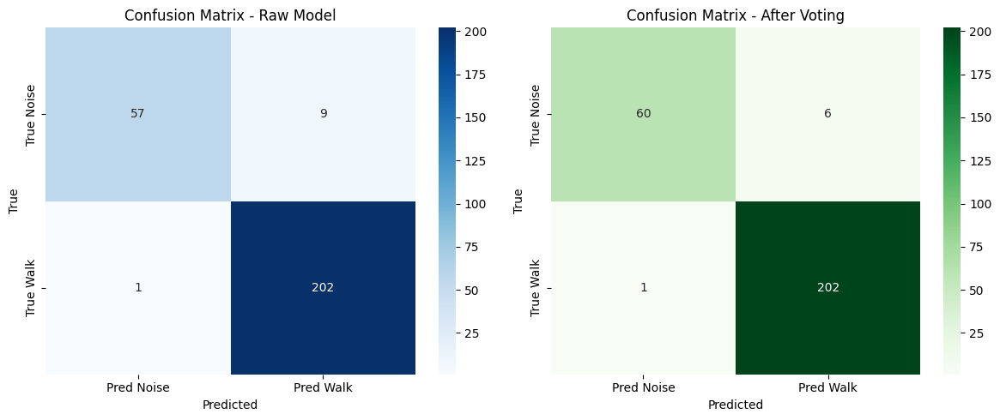

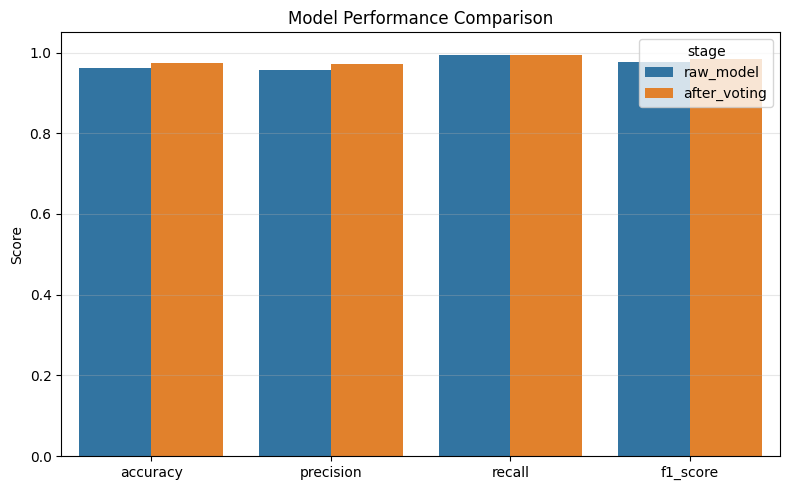

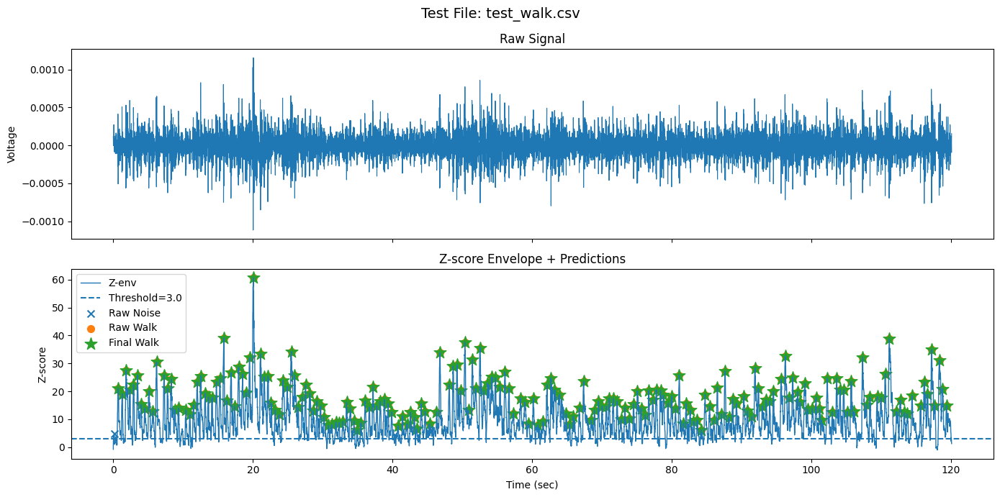

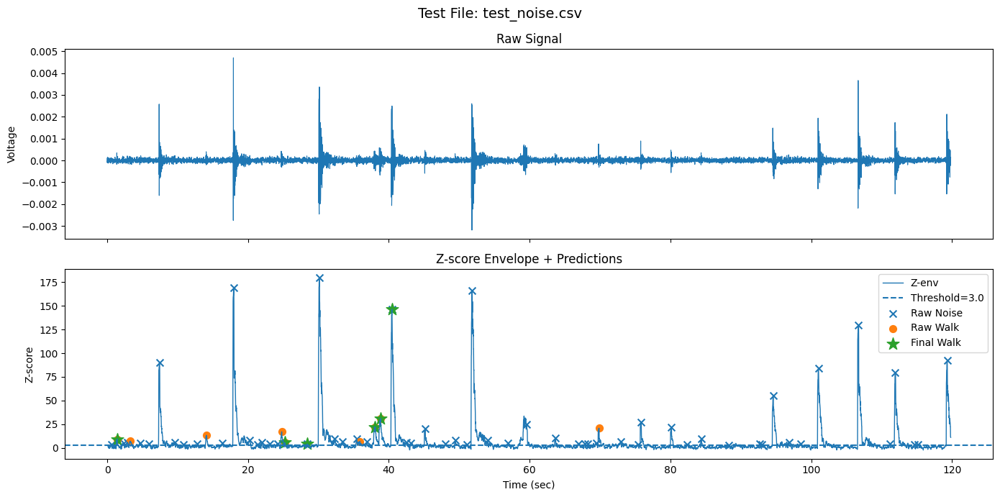


=== Raw model 오답 ===


,filename,peak_time_sec,true_label_str,pred_binary,final_state
0,test_walk.csv,0.139399,walk,0,0
204,test_noise.csv,1.423039,noise,1,1
207,test_noise.csv,3.275225,noise,1,0
214,test_noise.csv,14.070939,noise,1,0
222,test_noise.csv,24.779726,noise,1,0
223,test_noise.csv,25.217147,noise,1,1
229,test_noise.csv,35.883439,noise,1,0
231,test_noise.csv,37.969113,noise,1,1
232,test_noise.csv,38.814848,noise,1,1
249,test_noise.csv,69.863408,noise,1,0



=== Voting 후 최종 오답 ===


,filename,peak_time_sec,true_label_str,pred_binary,final_state
0,test_walk.csv,0.139399,walk,0,0
204,test_noise.csv,1.423039,noise,1,1
223,test_noise.csv,25.217147,noise,1,1
224,test_noise.csv,28.383922,noise,0,1
231,test_noise.csv,37.969113,noise,1,1
232,test_noise.csv,38.814848,noise,1,1
233,test_noise.csv,40.434223,noise,0,1


In [22]:
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, peak_prominences, peak_widths
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from collections import deque
import joblib
import seaborn as sns

# =========================================================
# 0. 경로 / 설정
# =========================================================
DATASET_DIR = Path("full_dataset")   # 기존 quiet_base가 있는 폴더
TEST_DIR = Path("test")              # test_walk.csv, test_noise.csv가 있는 폴더

MODEL_PATH = "har_geophone_rf_model_final.pkl"   # <- 여기에 네 모델 경로 넣기
# 예시:
# MODEL_PATH = "har_geophone_rf_model_v2.pkl"
# MODEL_PATH = "har_geophone_xgb_model.pkl"

WIN_SEC = 0.15
LOW_THRESHOLD = 3.0

VOTING_WINDOW = 3
WALK_THRESHOLD = 2

feature_cols = [
    'peak_height', 'peak_prominence', 'peak_width_sec',
    'local_rms', 'local_energy', 'area_above_threshold',
    'interval_prev', 'recent_peak_count_2s',
    'height_ratio_prev', 'prominence_ratio_prev', 'is_first_peak'
]

test_files = {
    "walk": TEST_DIR / "test_walk.csv",
    "noise": TEST_DIR / "test_noise.csv"
}

# =========================================================
# 1. 공통 함수
# =========================================================
def moving_rms(x, win):
    win = max(1, int(win))
    kernel = np.ones(win) / win
    return np.sqrt(np.convolve(x**2, kernel, mode="same"))

def compute_global_noise_profile():
    quiet_files = ["quiet_base_01.csv", "quiet_base_02.csv", "quiet_base_03.csv"]
    quiet_envs = []

    for qf in quiet_files:
        path = DATASET_DIR / qf
        if not path.exists():
            print(f"경고: {path} 없음")
            continue

        df = pd.read_csv(path)
        if len(df) < 2:
            continue

        v = df['voltage'].astype(float).to_numpy()
        t = df['t_wall'].astype(float).to_numpy()

        dt = np.median(np.diff(t))
        if np.isnan(dt) or dt <= 0:
            continue

        fs = 1.0 / dt
        x_centered = v - np.median(v)
        win_samples = int(fs * WIN_SEC)
        env = moving_rms(x_centered, win_samples)
        quiet_envs.extend(env)

    quiet_envs = np.array(quiet_envs)

    GLOBAL_MED = np.median(quiet_envs)
    GLOBAL_MAD = np.median(np.abs(quiet_envs - GLOBAL_MED))

    if GLOBAL_MAD == 0:
        GLOBAL_MAD = 1e-6

    return GLOBAL_MED, GLOBAL_MAD

def extract_features_from_file(path, true_label, GLOBAL_MED, GLOBAL_MAD):
    df = pd.read_csv(path)

    t = df['t_wall'].astype(float).to_numpy()
    v = df['voltage'].astype(float).to_numpy()
    t_rel = t - t[0]

    dt = np.median(np.diff(t))
    fs = 1.0 / dt

    # Z-score envelope
    x_centered = v - np.median(v)
    win_samples = int(fs * WIN_SEC)
    env = moving_rms(x_centered, win_samples)
    z_env = (env - GLOBAL_MED) / (1.4826 * GLOBAL_MAD)

    # 1단계: peak 탐지
    min_distance_samples = int(fs * 0.3)
    min_prominence = 4.0
    min_width_samples = int(fs * 0.05)
    max_width_samples = int(fs * 0.50)

    raw_peaks, _ = find_peaks(
        z_env,
        height=LOW_THRESHOLD,
        distance=min_distance_samples,
        prominence=min_prominence,
        width=[min_width_samples, max_width_samples]
    )

    # 2단계: echo 제거
    valid_peaks = []
    for p in raw_peaks:
        is_echo = False
        for vp in reversed(valid_peaks):
            if (t_rel[p] - t_rel[vp]) > 2.0:
                break
            if z_env[p] < z_env[vp] * 0.3:
                is_echo = True
                break
        if not is_echo:
            valid_peaks.append(p)

    valid_peaks = np.array(valid_peaks)

    # 3단계: feature 추출
    features_list = []

    if len(valid_peaks) > 0:
        prominences = peak_prominences(z_env, valid_peaks)[0]
        widths_sec = peak_widths(z_env, valid_peaks, rel_height=0.5)[0] / fs

        for i, p_idx in enumerate(valid_peaks):
            p_time = t_rel[p_idx]

            half_win = int(fs * 0.25)
            start_idx = max(0, p_idx - half_win)
            end_idx = min(len(z_env), p_idx + half_win + 1)
            local_z = z_env[start_idx:end_idx]

            peak_height = z_env[p_idx]
            peak_prominence = prominences[i]
            peak_width_sec = widths_sec[i]

            local_rms = np.sqrt(np.mean(local_z**2))
            local_energy = np.sum(local_z**2)
            area_above_thresh = np.sum(np.maximum(local_z - LOW_THRESHOLD, 0)) / fs

            if i == 0:
                is_first_peak = 1
                interval_prev = 0.5386
                recent_peak_count_2s = 0
                height_ratio_prev = 1.0
                prominence_ratio_prev = 1.0
            else:
                prev_idx = valid_peaks[i - 1]
                interval_prev = p_time - t_rel[prev_idx]

                recent_times = t_rel[valid_peaks[:i]]
                time_diffs = p_time - recent_times
                recent_peak_count_2s = int(np.sum((time_diffs > 0) & (time_diffs <= 2.0)))

                if interval_prev > 3.0:
                    is_first_peak = 1
                    interval_prev = 0.5386
                    height_ratio_prev = 1.0
                    prominence_ratio_prev = 1.0
                else:
                    is_first_peak = 0
                    prev_height = z_env[prev_idx]
                    prev_prom = prominences[i - 1]
                    height_ratio_prev = peak_height / prev_height if prev_height > 0 else 1.0
                    prominence_ratio_prev = peak_prominence / prev_prom if prev_prom > 0 else 1.0

            features_list.append({
                'filename': path.name,
                'true_label_str': true_label,
                'true_binary': 1 if true_label == 'walk' else 0,
                'peak_time_sec': p_time,
                'peak_height': peak_height,
                'peak_prominence': peak_prominence,
                'peak_width_sec': peak_width_sec,
                'local_rms': local_rms,
                'local_energy': local_energy,
                'area_above_threshold': area_above_thresh,
                'interval_prev': interval_prev,
                'recent_peak_count_2s': recent_peak_count_2s,
                'height_ratio_prev': height_ratio_prev,
                'prominence_ratio_prev': prominence_ratio_prev,
                'is_first_peak': is_first_peak
            })

    df_feat = pd.DataFrame(features_list)

    meta = {
        "df_raw": df,
        "t_rel": t_rel,
        "v": v,
        "env": env,
        "z_env": z_env,
        "raw_peaks": raw_peaks,
        "valid_peaks": valid_peaks,
        "fs": fs
    }

    return df_feat, meta

def apply_voting(df_pred, voting_window=3, walk_threshold=2):
    recent_preds = deque(maxlen=voting_window)
    final_states = []

    for _, row in df_pred.iterrows():
        raw_pred = int(row['pred_binary'])
        recent_preds.append(raw_pred)

        if len(recent_preds) < voting_window:
            final_state = raw_pred
        else:
            final_state = 1 if sum(recent_preds) >= walk_threshold else 0

        final_states.append(final_state)

    df_pred = df_pred.copy()
    df_pred['final_state'] = final_states
    return df_pred

def compute_metrics(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1_score": f1_score(y_true, y_pred, zero_division=0)
    }

# =========================================================
# 2. 초기 threshold 기준 계산
# =========================================================
GLOBAL_MED, GLOBAL_MAD = compute_global_noise_profile()

print("=== 초기 노이즈 프로파일 ===")
print(f"GLOBAL_MED : {GLOBAL_MED:.8f}")
print(f"GLOBAL_MAD : {GLOBAL_MAD:.8f}")
print(f"LOW_THRESHOLD : {LOW_THRESHOLD}")

# =========================================================
# 3. 모델 로드
# =========================================================

model = joblib.load(MODEL_PATH)
print(f"\n모델 로드 완료: {MODEL_PATH}")

# =========================================================
# 4. 테스트 feature 추출
# =========================================================
all_test_features = []
meta_dict = {}

for label, path in test_files.items():
    if not path.exists():
        raise FileNotFoundError(f"테스트 파일 없음: {path}")

    df_feat, meta = extract_features_from_file(path, label, GLOBAL_MED, GLOBAL_MAD)
    meta_dict[label] = meta

    print(f"\n[{path.name}]")
    print(f" - raw peak 수   : {len(meta['raw_peaks'])}")
    print(f" - valid peak 수 : {len(meta['valid_peaks'])}")
    print(f" - 추출 feature 수: {len(df_feat)}")

    all_test_features.append(df_feat)

df_test = pd.concat(all_test_features, ignore_index=True)

if len(df_test) == 0:
    raise ValueError("테스트 파일에서 추출된 peak(feature)가 0개야. threshold나 데이터 상태를 먼저 확인해봐.")

display(df_test.head())

# =========================================================
# 5. 모델 예측 + voting 후처리
# =========================================================
X_test = df_test[feature_cols]
df_test['pred_binary'] = model.predict(X_test)

# 파일별로 voting 적용
df_result_list = []
for fname, g in df_test.groupby('filename', sort=False):
    g = g.sort_values('peak_time_sec').reset_index(drop=True)
    g = apply_voting(g, voting_window=VOTING_WINDOW, walk_threshold=WALK_THRESHOLD)
    df_result_list.append(g)

df_result = pd.concat(df_result_list, ignore_index=True)

# =========================================================
# 6. 지표 계산
# =========================================================
y_true = df_result['true_binary']
y_pred_raw = df_result['pred_binary']
y_pred_final = df_result['final_state']

raw_metrics = compute_metrics(y_true, y_pred_raw)
final_metrics = compute_metrics(y_true, y_pred_final)

metrics_df = pd.DataFrame([
    {
        "stage": "raw_model",
        "accuracy": raw_metrics["accuracy"],
        "precision": raw_metrics["precision"],
        "recall": raw_metrics["recall"],
        "f1_score": raw_metrics["f1_score"]
    },
    {
        "stage": "after_voting",
        "accuracy": final_metrics["accuracy"],
        "precision": final_metrics["precision"],
        "recall": final_metrics["recall"],
        "f1_score": final_metrics["f1_score"]
    }
])

print("\n=== 전체 성능 요약 ===")
display(metrics_df.round(4))

print("\n=== Raw prediction classification report ===")
display(pd.DataFrame(classification_report(y_true, y_pred_raw, target_names=['Noise (0)', 'Walk (1)'], output_dict=True)).transpose().round(4))

print("\n=== Final prediction classification report ===")
display(pd.DataFrame(classification_report(y_true, y_pred_final, target_names=['Noise (0)', 'Walk (1)'], output_dict=True)).transpose().round(4))

# =========================================================
# 7. 파일별 요약 표
# =========================================================
summary_rows = []
for fname, g in df_result.groupby("filename", sort=False):
    true_label = g['true_label_str'].iloc[0]
    true_binary = g['true_binary'].iloc[0]

    summary_rows.append({
        "filename": fname,
        "true_label": true_label,
        "num_detected_peaks": len(g),
        "raw_walk_preds": int((g['pred_binary'] == 1).sum()),
        "raw_noise_preds": int((g['pred_binary'] == 0).sum()),
        "final_walk_preds": int((g['final_state'] == 1).sum()),
        "final_noise_preds": int((g['final_state'] == 0).sum()),
        "raw_accuracy_in_file": accuracy_score(g['true_binary'], g['pred_binary']),
        "final_accuracy_in_file": accuracy_score(g['true_binary'], g['final_state'])
    })

summary_df = pd.DataFrame(summary_rows)

print("\n=== 파일별 요약 ===")
display(summary_df.round(4))

# =========================================================
# 8. 혼동행렬 시각화
# =========================================================
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

cm_raw = confusion_matrix(y_true, y_pred_raw)
cm_final = confusion_matrix(y_true, y_pred_final)

sns.heatmap(
    cm_raw, annot=True, fmt='d', cmap='Blues',
    xticklabels=['Pred Noise', 'Pred Walk'],
    yticklabels=['True Noise', 'True Walk'],
    ax=axes[0]
)
axes[0].set_title("Confusion Matrix - Raw Model")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("True")

sns.heatmap(
    cm_final, annot=True, fmt='d', cmap='Greens',
    xticklabels=['Pred Noise', 'Pred Walk'],
    yticklabels=['True Noise', 'True Walk'],
    ax=axes[1]
)
axes[1].set_title("Confusion Matrix - After Voting")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("True")

plt.tight_layout()
plt.show()

# =========================================================
# 9. 성능 지표 막대그래프
# =========================================================
plot_df = metrics_df.melt(id_vars="stage", var_name="metric", value_name="score")

plt.figure(figsize=(8, 5))
sns.barplot(data=plot_df, x="metric", y="score", hue="stage")
plt.ylim(0, 1.05)
plt.title("Model Performance Comparison")
plt.ylabel("Score")
plt.xlabel("")
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# =========================================================
# 10. 테스트 신호 시각화 (파일별)
# =========================================================
for label, path in test_files.items():
    meta = meta_dict[label]
    t_rel = meta['t_rel']
    v = meta['v']
    z_env = meta['z_env']
    valid_peaks = meta['valid_peaks']

    file_result = df_result[df_result['filename'] == path.name].sort_values('peak_time_sec')

    fig, axes = plt.subplots(2, 1, figsize=(14, 7), sharex=True)
    fig.suptitle(f"Test File: {path.name}", fontsize=14)

    # Raw signal
    axes[0].plot(t_rel, v, linewidth=0.8)
    axes[0].set_ylabel("Voltage")
    axes[0].set_title("Raw Signal")

    # Z-score envelope
    axes[1].plot(t_rel, z_env, linewidth=1.0, label="Z-env")
    axes[1].axhline(LOW_THRESHOLD, linestyle='--', label=f"Threshold={LOW_THRESHOLD}")

    if len(file_result) > 0:
        raw_walk = file_result[file_result['pred_binary'] == 1]
        raw_noise = file_result[file_result['pred_binary'] == 0]
        final_walk = file_result[file_result['final_state'] == 1]

        axes[1].scatter(raw_noise['peak_time_sec'], raw_noise['peak_height'], marker='x', s=50, label='Raw Noise')
        axes[1].scatter(raw_walk['peak_time_sec'], raw_walk['peak_height'], marker='o', s=50, label='Raw Walk')
        axes[1].scatter(final_walk['peak_time_sec'], final_walk['peak_height'], marker='*', s=160, label='Final Walk')

    axes[1].set_ylabel("Z-score")
    axes[1].set_xlabel("Time (sec)")
    axes[1].set_title("Z-score Envelope + Predictions")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# =========================================================
# 11. 오답만 따로 보기
# =========================================================
wrong_raw = df_result[df_result['true_binary'] != df_result['pred_binary']].copy()
wrong_final = df_result[df_result['true_binary'] != df_result['final_state']].copy()

print("\n=== Raw model 오답 ===")
if len(wrong_raw) == 0:
    print("오답 없음")
else:
    display(wrong_raw[['filename', 'peak_time_sec', 'true_label_str', 'pred_binary', 'final_state']])

print("\n=== Voting 후 최종 오답 ===")
if len(wrong_final) == 0:
    print("오답 없음")
else:
    display(wrong_final[['filename', 'peak_time_sec', 'true_label_str', 'pred_binary', 'final_state']])